In [0]:
spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.3.2 
 Master 
 local[8] 
 AppName 
 Databricks Shell

In [0]:
from pyspark.sql import SparkSession

# Create Session
spark = SparkSession.builder.appName('IPL Data Analysis').getOrCreate()

In [0]:
spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.3.2 
 Master 
 local[8] 
 AppName 
 Databricks Shell

In [0]:
ball_by_ball_df = spark.read.format('csv')\
    .option('inferschema', True)\
    .option('header', True)\
    .load('s3://ipl-data-analysis-us-east-1-project/raw_data_csv/Ball_By_Ball.csv')

In [0]:
ball_by_ball_df.show(5)

+--------+-------+-------+----------+------------+------------+------------------------+----------+-----------+----------+-----+-------+----+-------+-------+-------------+--------------+------+------+-------+---+------------+-------+-----------------+----------+----------------+-------------+----------+------+-------+-----------+------+----------+--------+----------------+---------+-------------------+-------------+----------------+----------+---------------+---------+------------------+--------------+--------------+------------+-------------+-----------+
|MatcH_id|Over_id|Ball_id|Innings_No|Team_Batting|Team_Bowling|Striker_Batting_Position|Extra_Type|Runs_Scored|Extra_runs|Wides|Legbyes|Byes|Noballs|Penalty|Bowler_Extras|      Out_type|Caught|Bowled|Run_out|LBW|Retired_hurt|Stumped|caught_and_bowled|hit_wicket|ObstructingFeild|Bowler_Wicket|Match_Date|Season|Striker|Non_Striker|Bowler|Player_Out|Fielders|Striker_match_SK|StrikerSK|NonStriker_match_SK|NONStriker_SK|Fielder_match_SK|Fi

In [0]:
from pyspark.sql.types import *
from pyspark.sql.functions import *
from pyspark.sql.window import Window

In [0]:
ball_by_ball_schema = '''
    MatcH_id integer,
    Over_id integer,
    Ball_id integer,
    Innings_No integer,
    Team_Batting string,
    Team_Bowling string,
    Striker_Batting_Position integer,
    Extra_Type string,
    Runs_Scored integer,
    Extra_runs integer,
    Wides integer,
    Legbyes integer,
    Byes integer,
    Noballs integer,
    Penalty integer,
    Bowler_Extras integer,
    Out_type string,
    Caught boolean, 
    Bowled boolean,
    Run_out boolean, 
    LBW boolean, 
    Retired_hurt boolean, 
    Stumped boolean, 
    caught_and_bowled boolean, 
    hit_wicket boolean, 
    ObstructingFeild Boolean, 
    Bowler_Wicket boolean, 
    Match_Date date,
    Season integer, 
    Striker integer, 
    Non_Striker integer, 
    Bowler integer,
    Player_Out integer, 
    Fielders integer,
    Striker_match_SK integer,
    StrikerSK integer, 
    NonStriker_match_SK integer, 
    NONStriker_SK integer, 
    Fielder_match_SK integer,
    Fielder_SK integer, 
    Bowler_match_SK integer, 
    BOWLER_SK integer, 
    PlayerOut_match_SK integer,
    BattingTeam_SK integer,
    BowlingTeam_SK integer,
    Keeper_Catch boolean,
    Player_out_sk integer,
    MatchDateSK date      
 '''

In [0]:
ball_by_ball_df = spark.read.format('csv')\
    .schema(ball_by_ball_schema)\
    .option('header', True)\
    .load('s3://ipl-data-analysis-us-east-1-project/raw_data_csv/Ball_By_Ball.csv')

In [0]:
ball_by_ball_df.show(5)

+--------+-------+-------+----------+------------+------------+------------------------+----------+-----------+----------+-----+-------+----+-------+-------+-------------+--------------+------+------+-------+----+------------+-------+-----------------+----------+----------------+-------------+----------+------+-------+-----------+------+----------+--------+----------------+---------+-------------------+-------------+----------------+----------+---------------+---------+------------------+--------------+--------------+------------+-------------+-----------+
|MatcH_id|Over_id|Ball_id|Innings_No|Team_Batting|Team_Bowling|Striker_Batting_Position|Extra_Type|Runs_Scored|Extra_runs|Wides|Legbyes|Byes|Noballs|Penalty|Bowler_Extras|      Out_type|Caught|Bowled|Run_out| LBW|Retired_hurt|Stumped|caught_and_bowled|hit_wicket|ObstructingFeild|Bowler_Wicket|Match_Date|Season|Striker|Non_Striker|Bowler|Player_Out|Fielders|Striker_match_SK|StrikerSK|NonStriker_match_SK|NONStriker_SK|Fielder_match_SK|

In [0]:
match_df = spark.read.format('csv')\
    .option('inferschema', True)\
    .option('header', True)\
    .load('s3://ipl-data-analysis-us-east-1-project/raw_data_csv/Match.csv')

In [0]:
match_df.printSchema()

root
 |-- Match_SK: integer (nullable = true)
 |-- match_id: integer (nullable = true)
 |-- Team1: string (nullable = true)
 |-- Team2: string (nullable = true)
 |-- match_date: date (nullable = true)
 |-- Season_Year: integer (nullable = true)
 |-- Venue_Name: string (nullable = true)
 |-- City_Name: string (nullable = true)
 |-- Country_Name: string (nullable = true)
 |-- Toss_Winner: string (nullable = true)
 |-- match_winner: string (nullable = true)
 |-- Toss_Name: string (nullable = true)
 |-- Win_Type: string (nullable = true)
 |-- Outcome_Type: string (nullable = true)
 |-- ManOfMach: string (nullable = true)
 |-- Win_Margin: string (nullable = true)
 |-- Country_id: integer (nullable = true)



In [0]:
match_schema = StructType([
    StructField("match_sk", IntegerType(), True),
    StructField("match_id", IntegerType(), True),
    StructField("team1", StringType(), True),
    StructField("team2", StringType(), True),
    StructField("match_date", DateType(), True),
    StructField("season_year", IntegerType(), True),
    StructField("venue_name", StringType(), True),
    StructField("city_name", StringType(), True),
    StructField("country_name", StringType(), True),
    StructField("toss_winner", StringType(), True),
    StructField("match_winner", StringType(), True),
    StructField("toss_name", StringType(), True),
    StructField("win_type", StringType(), True),
    StructField("outcome_type", StringType(), True),
    StructField("manofmach", StringType(), True),
    StructField("win_margin", IntegerType(), True),
    StructField("country_id", IntegerType(), True)
])

In [0]:
match_df = spark.read.format('csv')\
    .schema(match_schema)\
    .option('header', True)\
    .load('s3://ipl-data-analysis-us-east-1-project/raw_data_csv/Match.csv')

In [0]:
match_df.show(5)

+--------+--------+--------------------+--------------------+----------+-----------+--------------------+----------+------------+--------------------+--------------------+---------+--------+------------+-----------+----------+----------+
|match_sk|match_id|               team1|               team2|match_date|season_year|          venue_name| city_name|country_name|         toss_winner|        match_winner|toss_name|win_type|outcome_type|  manofmach|win_margin|country_id|
+--------+--------+--------------------+--------------------+----------+-----------+--------------------+----------+------------+--------------------+--------------------+---------+--------+------------+-----------+----------+----------+
|       0|  335987|Royal Challengers...|Kolkata Knight Ri...|      null|       2008|M Chinnaswamy Sta...| Bangalore|       India|Royal Challengers...|Kolkata Knight Ri...|    field|    runs|      Result|BB McCullum|       140|         1|
|       1|  335988|     Kings XI Punjab| Chennai

In [0]:
player_match_df = spark.read.format('csv')\
    .option('inferschema', True)\
    .option('header', True)\
    .load('s3://ipl-data-analysis-us-east-1-project/raw_data_csv/Player_match.csv')

In [0]:
player_match_df.printSchema()

root
 |-- Player_match_SK: integer (nullable = true)
 |-- PlayerMatch_key: double (nullable = true)
 |-- Match_Id: integer (nullable = true)
 |-- Player_Id: integer (nullable = true)
 |-- Player_Name: string (nullable = true)
 |-- DOB: date (nullable = true)
 |-- Batting_hand: string (nullable = true)
 |-- Bowling_skill: string (nullable = true)
 |-- Country_Name: string (nullable = true)
 |-- Role_Desc: string (nullable = true)
 |-- Player_team: string (nullable = true)
 |-- Opposit_Team: string (nullable = true)
 |-- Season_year: integer (nullable = true)
 |-- is_manofThematch: integer (nullable = true)
 |-- Age_As_on_match: integer (nullable = true)
 |-- IsPlayers_Team_won: integer (nullable = true)
 |-- Batting_Status: string (nullable = true)
 |-- Bowling_Status: string (nullable = true)
 |-- Player_Captain: string (nullable = true)
 |-- Opposit_captain: string (nullable = true)
 |-- Player_keeper: string (nullable = true)
 |-- Opposit_keeper: string (nullable = true)



In [0]:
player_match_schema = StructType([
    StructField("player_match_sk", IntegerType(), True),
    StructField("playermatch_key", DecimalType(10, 2), True),
    StructField("match_id", IntegerType(), True),
    StructField("player_id", IntegerType(), True),
    StructField("player_name", StringType(), True),
    StructField("dob", DateType(), True),
    StructField("batting_hand", StringType(), True),
    StructField("bowling_skill", StringType(), True),
    StructField("country_name", StringType(), True),
    StructField("role_desc", StringType(), True),
    StructField("player_team", StringType(), True),
    StructField("opposit_team", StringType(), True),
    StructField("season_year", IntegerType(), True),
    StructField("is_manofthematch", BooleanType(), True),
    StructField("age_as_on_match", IntegerType(), True),
    StructField("isplayers_team_won", BooleanType(), True),
    StructField("batting_status", StringType(), True),
    StructField("bowling_status", StringType(), True),
    StructField("player_captain", StringType(), True),
    StructField("opposit_captain", StringType(), True),
    StructField("player_keeper", StringType(), True),
    StructField("opposit_keeper", StringType(), True)
])

In [0]:
player_match_df = spark.read.format('csv')\
    .schema(player_match_schema)\
    .option('header', True)\
    .load('s3://ipl-data-analysis-us-east-1-project/raw_data_csv/Player_match.csv')

In [0]:
player_match_df.show()

+---------------+---------------+--------+---------+---------------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+--------------+---------------+-------------+--------------+
|player_match_sk|playermatch_key|match_id|player_id|    player_name| dob|  batting_hand|       bowling_skill|country_name|role_desc|         player_team|        opposit_team|season_year|is_manofthematch|age_as_on_match|isplayers_team_won|batting_status|bowling_status|player_captain|opposit_captain|player_keeper|opposit_keeper|
+---------------+---------------+--------+---------+---------------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+--------------+---------------+-------------+--------------+
|            

In [0]:
player_df = spark.read.format('csv')\
    .option('inferschema', True)\
    .option('header', True)\
    .load('s3://ipl-data-analysis-us-east-1-project/raw_data_csv/Player.csv')

In [0]:
player_df.show()

+---------+---------+---------------+----------+--------------+--------------------+------------+
|PLAYER_SK|Player_Id|    Player_Name|       DOB|  Batting_hand|       Bowling_skill|Country_Name|
+---------+---------+---------------+----------+--------------+--------------------+------------+
|        0|        1|     SC Ganguly|1972-07-08| Left-hand bat|    Right-arm medium|       India|
|        1|        2|    BB McCullum|1981-09-27|Right-hand bat|    Right-arm medium| New Zealand|
|        2|        3|     RT Ponting|1974-12-19|Right-hand bat|    Right-arm medium|   Australia|
|        3|        4|      DJ Hussey|1977-07-15|Right-hand bat|  Right-arm offbreak|   Australia|
|        4|        5|Mohammad Hafeez|1980-10-17|Right-hand bat|  Right-arm offbreak|    Pakistan|
|        5|        6|       R Dravid|1973-01-11|Right-hand bat|  Right-arm offbreak|       India|
|        6|        7|       W Jaffer|1978-02-16|Right-hand bat|  Right-arm offbreak|       India|
|        7|        8

In [0]:
team_df = spark.read.format('csv')\
    .option('inferschema', True)\
    .option('header', True)\
    .load('s3://ipl-data-analysis-us-east-1-project/raw_data_csv/Team.csv')

In [0]:
team_df.printSchema()

root
 |-- Team_SK: integer (nullable = true)
 |-- Team_Id: integer (nullable = true)
 |-- Team_Name: string (nullable = true)



### Transformation

In [0]:
from pyspark.sql.functions import *

In [0]:
ball_by_ball_df.show(5)

+--------+-------+-------+----------+------------+------------+------------------------+----------+-----------+----------+-----+-------+----+-------+-------+-------------+--------------+------+------+-------+----+------------+-------+-----------------+----------+----------------+-------------+----------+------+-------+-----------+------+----------+--------+----------------+---------+-------------------+-------------+----------------+----------+---------------+---------+------------------+--------------+--------------+------------+-------------+-----------+
|MatcH_id|Over_id|Ball_id|Innings_No|Team_Batting|Team_Bowling|Striker_Batting_Position|Extra_Type|Runs_Scored|Extra_runs|Wides|Legbyes|Byes|Noballs|Penalty|Bowler_Extras|      Out_type|Caught|Bowled|Run_out| LBW|Retired_hurt|Stumped|caught_and_bowled|hit_wicket|ObstructingFeild|Bowler_Wicket|Match_Date|Season|Striker|Non_Striker|Bowler|Player_Out|Fielders|Striker_match_SK|StrikerSK|NonStriker_match_SK|NONStriker_SK|Fielder_match_SK|

In [0]:
#Filter to include only valid deliveries (excluding extras like wides and no balls for specific analyses)

ball_by_ball_df = ball_by_ball_df.filter((col('Wides') == 0 ) & (col('Noballs') == 0))

# Aggregation: Calculate the total and average run scored in each match and inning

total_and_avg_runs = ball_by_ball_df.groupBy('MatcH_id','Innings_No')\
        .agg(sum('Runs_Scored').alias('Total Runs'),
             avg('Runs_Scored').alias('Average Runs'))\
        .sort('MatcH_id')

In [0]:
# Windows Functions: Calculate running total of runs in each match for each over

windowSpec = Window.partitionBy('Match_id', 'Innings_No').orderBy('Over_id')

ball_by_ball_df = ball_by_ball_df.withColumn('Running_total', sum('Runs_Scored').over(windowSpec))



In [0]:
# Conditional Column: Flag for high impact balls(either a wicket or more than 6 runs including extras)

ball_by_ball_df = ball_by_ball_df.withColumn('Flag', when((col('Runs_Scored') + col('Extra_runs') > 6) | (col('Bowler_Wicket')== True),'High Impact').otherwise('Low Impact'))


In [0]:
ball_by_ball_df.show(5)

+--------+-------+-------+----------+------------+------------+------------------------+----------+-----------+----------+-----+-------+----+-------+-------+-------------+--------------+------+------+-------+----+------------+-------+-----------------+----------+----------------+-------------+----------+------+-------+-----------+------+----------+--------+----------------+---------+-------------------+-------------+----------------+----------+---------------+---------+------------------+--------------+--------------+------------+-------------+-----------+-------------+----------+
|MatcH_id|Over_id|Ball_id|Innings_No|Team_Batting|Team_Bowling|Striker_Batting_Position|Extra_Type|Runs_Scored|Extra_runs|Wides|Legbyes|Byes|Noballs|Penalty|Bowler_Extras|      Out_type|Caught|Bowled|Run_out| LBW|Retired_hurt|Stumped|caught_and_bowled|hit_wicket|ObstructingFeild|Bowler_Wicket|Match_Date|Season|Striker|Non_Striker|Bowler|Player_Out|Fielders|Striker_match_SK|StrikerSK|NonStriker_match_SK|NONStr

In [0]:
match_df.display()

match_sk,match_id,team1,team2,match_date,season_year,venue_name,city_name,country_name,toss_winner,match_winner,toss_name,win_type,outcome_type,manofmach,win_margin,country_id
0,335987,Royal Challengers Bangalore,Kolkata Knight Riders,null,2008,M Chinnaswamy Stadium,Bangalore,India,Royal Challengers Bangalore,Kolkata Knight Riders,field,runs,Result,BB McCullum,140,1
1,335988,Kings XI Punjab,Chennai Super Kings,null,2008,"Punjab Cricket Association Stadium, Mohali",Chandigarh,India,Chennai Super Kings,Chennai Super Kings,bat,runs,Result,MEK Hussey,33,1
2,335989,Delhi Daredevils,Rajasthan Royals,null,2008,Feroz Shah Kotla,Delhi,India,Rajasthan Royals,Delhi Daredevils,bat,wickets,Result,MF Maharoof,9,1
3,335990,Mumbai Indians,Royal Challengers Bangalore,null,2008,Wankhede Stadium,Mumbai,India,Mumbai Indians,Royal Challengers Bangalore,bat,wickets,Result,MV Boucher,5,1
4,335991,Kolkata Knight Riders,Deccan Chargers,null,2008,Eden Gardens,Kolkata,India,Deccan Chargers,Kolkata Knight Riders,bat,wickets,Result,DJ Hussey,5,1
5,335992,Rajasthan Royals,Kings XI Punjab,null,2008,Sawai Mansingh Stadium,Jaipur,India,Kings XI Punjab,Rajasthan Royals,bat,wickets,Result,SR Watson,6,1
6,335993,Deccan Chargers,Delhi Daredevils,null,2008,"Rajiv Gandhi International Stadium, Uppal",Hyderabad,India,Deccan Chargers,Delhi Daredevils,bat,wickets,Result,V Sehwag,9,1
7,335994,Chennai Super Kings,Mumbai Indians,null,2008,"MA Chidambaram Stadium, Chepauk",Chennai,India,Mumbai Indians,Chennai Super Kings,field,runs,Result,ML Hayden,6,1
8,335995,Deccan Chargers,Rajasthan Royals,null,2008,"Rajiv Gandhi International Stadium, Uppal",Hyderabad,India,Rajasthan Royals,Rajasthan Royals,field,wickets,Result,YK Pathan,3,1
9,335996,Kings XI Punjab,Mumbai Indians,null,2008,"Punjab Cricket Association Stadium, Mohali",Chandigarh,India,Mumbai Indians,Kings XI Punjab,field,runs,Result,KC Sangakkara,66,1


In [0]:
# Extracting year, month, and day from the match date for more detailed time-based analysis
match_df = match_df.withColumn('Year', year(col('match_date')))\
                .withColumn('Month', month(col('match_date')))\
                .withColumn('day', dayofmonth(col('match_date')))

In [0]:
# High margin win: categorizing win margins into 'high', 'medium' and 'low'
match_df = match_df.withColumn(
    'Win_Margin', 
    when(col('win_margin') >= 100, "High")
    .when((col('win_margin') >= 50) & (col('win_margin') < 100), "Medium")
    .otherwise("Low")
)
# Analyze the impact of the toss: who wins the toss and the match
match_df = match_df.withColumn('toss_match_winner',when(col('toss_winner') == col('match_winner'), 'Yes').otherwise('No'))

# Show the enhanced match DataFrame
match_df.show(5)

+--------+--------+--------------------+--------------------+----------+-----------+--------------------+----------+------------+--------------------+--------------------+---------+--------+------------+-----------+----------+----------+----+-----+----+-----------------+
|match_sk|match_id|               team1|               team2|match_date|season_year|          venue_name| city_name|country_name|         toss_winner|        match_winner|toss_name|win_type|outcome_type|  manofmach|Win_Margin|country_id|Year|Month| day|toss_match_winner|
+--------+--------+--------------------+--------------------+----------+-----------+--------------------+----------+------------+--------------------+--------------------+---------+--------+------------+-----------+----------+----------+----+-----+----+-----------------+
|       0|  335987|Royal Challengers...|Kolkata Knight Ri...|      null|       2008|M Chinnaswamy Sta...| Bangalore|       India|Royal Challengers...|Kolkata Knight Ri...|    field|   

In [0]:
player_df.display()

PLAYER_SK,Player_Id,Player_Name,DOB,Batting_hand,Bowling_skill,Country_Name
0,1,SC Ganguly,1972-07-08,Left-hand bat,Right-arm medium,India
1,2,BB McCullum,1981-09-27,Right-hand bat,Right-arm medium,New Zealand
2,3,RT Ponting,1974-12-19,Right-hand bat,Right-arm medium,Australia
3,4,DJ Hussey,1977-07-15,Right-hand bat,Right-arm offbreak,Australia
4,5,Mohammad Hafeez,1980-10-17,Right-hand bat,Right-arm offbreak,Pakistan
5,6,R Dravid,1973-01-11,Right-hand bat,Right-arm offbreak,India
6,7,W Jaffer,1978-02-16,Right-hand bat,Right-arm offbreak,India
7,8,V Kohli,1988-11-05,Right-hand bat,Right-arm medium,India
8,9,JH Kallis,1975-10-16,Right-hand bat,Right-arm fast-medium,South Africa
9,10,CL White,1983-08-18,Right-hand bat,Legbreak googly,Australia


In [0]:
#Normalize and clean player name
player_df = player_df.withColumn('Player_Name', lower(regexp_replace('Player_Name', '[^a-zA-Z0-9]', ' ')))

# Handle missing values in 'batting_hand' and 'bowling_skill' with a default 'unkown'
player_df = player_df.fillna('Unknown', subset='Bowling_skill')\
                     .fillna('Unknown', subset = 'Batting_hand')

# Categorizing players based on batting hand
player_df = player_df.withColumn('Player_Style', when(col('Batting_hand').contains('Left'), 'Left hand bat')
                                 .otherwise('Right hand bat'))

# Show modified player DataFrame
player_df.show()

+---------+---------+---------------+----------+--------------+--------------------+------------+--------------+
|PLAYER_SK|Player_Id|    Player_Name|       DOB|  Batting_hand|       Bowling_skill|Country_Name|  Player_Style|
+---------+---------+---------------+----------+--------------+--------------------+------------+--------------+
|        0|        1|     sc ganguly|1972-07-08| Left-hand bat|    Right-arm medium|       India| Left hand bat|
|        1|        2|    bb mccullum|1981-09-27|Right-hand bat|    Right-arm medium| New Zealand|Right hand bat|
|        2|        3|     rt ponting|1974-12-19|Right-hand bat|    Right-arm medium|   Australia|Right hand bat|
|        3|        4|      dj hussey|1977-07-15|Right-hand bat|  Right-arm offbreak|   Australia|Right hand bat|
|        4|        5|mohammad hafeez|1980-10-17|Right-hand bat|  Right-arm offbreak|    Pakistan|Right hand bat|
|        5|        6|       r dravid|1973-01-11|Right-hand bat|  Right-arm offbreak|       India

In [0]:
player_match_df.display()

player_match_sk,playermatch_key,match_id,player_id,player_name,dob,batting_hand,bowling_skill,country_name,role_desc,player_team,opposit_team,season_year,is_manofthematch,age_as_on_match,isplayers_team_won,batting_status,bowling_status,player_captain,opposit_captain,player_keeper,opposit_keeper
-1,-1.00,-1,-1,N/A,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
12694,null,335987,6,R Dravid,null,Right-hand bat,Right-arm offbreak,India,Captain,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,35,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha
12695,null,335987,7,W Jaffer,null,Right-hand bat,Right-arm offbreak,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,30,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha
12696,null,335987,8,V Kohli,null,Right-hand bat,Right-arm medium,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,20,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha
12697,null,335987,9,JH Kallis,null,Right-hand bat,Right-arm fast-medium,South Africa,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,33,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha
12698,null,335987,10,CL White,null,Right-hand bat,Legbreak googly,Australia,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,25,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha
12699,null,335987,11,MV Boucher,null,Right-hand bat,Right-arm medium,South Africa,Keeper,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,32,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha
12700,null,335987,12,B Akhil,null,Right-hand bat,Right-arm medium-fast,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,31,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha
12701,null,335987,13,AA Noffke,null,Right-hand bat,Right-arm fast-medium,Australia,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,31,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha
12702,null,335987,14,P Kumar,null,Right-hand bat,Right-arm medium,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,22,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha


In [0]:
# Add a 'veteran_status' column based on player age
player_match_df = player_match_df.withColumn('Player_Status', 
                           when(col('age_as_on_match') >= 35, 'Veteran')
                           .otherwise('Non-Veteran'))

In [0]:

# Filter to include only players who played the match(excluding bench players)
# player_match_df = player_match_df.filter(col('batting_status') != 'Did Not Bat')

# Dynamic column to calculate years since debut
player_match_df = player_match_df.withColumn('Total_Experience', (year(current_date()) - col('season_year')))

# Show the Player_match DataFrame
player_match_df.show()

+---------------+---------------+--------+---------+---------------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+--------------+---------------+-------------+--------------+-------------+----------------+
|player_match_sk|playermatch_key|match_id|player_id|    player_name| dob|  batting_hand|       bowling_skill|country_name|role_desc|         player_team|        opposit_team|season_year|is_manofthematch|age_as_on_match|isplayers_team_won|batting_status|bowling_status|player_captain|opposit_captain|player_keeper|opposit_keeper|Player_Status|Total_Experience|
+---------------+---------------+--------+---------+---------------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+------------

In [0]:
player_match_df.display()

player_match_sk,playermatch_key,match_id,player_id,player_name,dob,batting_hand,bowling_skill,country_name,role_desc,player_team,opposit_team,season_year,is_manofthematch,age_as_on_match,isplayers_team_won,batting_status,bowling_status,player_captain,opposit_captain,player_keeper,opposit_keeper,Player_Status,Total_Experience
-1,-1.00,-1,-1,N/A,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,Non-Veteran,null
12694,null,335987,6,R Dravid,null,Right-hand bat,Right-arm offbreak,India,Captain,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,35,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Veteran,17
12695,null,335987,7,W Jaffer,null,Right-hand bat,Right-arm offbreak,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,30,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,17
12696,null,335987,8,V Kohli,null,Right-hand bat,Right-arm medium,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,20,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,17
12697,null,335987,9,JH Kallis,null,Right-hand bat,Right-arm fast-medium,South Africa,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,33,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,17
12698,null,335987,10,CL White,null,Right-hand bat,Legbreak googly,Australia,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,25,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,17
12699,null,335987,11,MV Boucher,null,Right-hand bat,Right-arm medium,South Africa,Keeper,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,32,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,17
12700,null,335987,12,B Akhil,null,Right-hand bat,Right-arm medium-fast,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,31,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,17
12701,null,335987,13,AA Noffke,null,Right-hand bat,Right-arm fast-medium,Australia,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,31,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,17
12702,null,335987,14,P Kumar,null,Right-hand bat,Right-arm medium,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,22,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,17


### SQL

In [0]:
ball_by_ball_df.createOrReplaceTempView('ball_by_ball')
match_df.createOrReplaceTempView('match')
player_df.createOrReplaceTempView('player')
player_match_df.createOrReplaceTempView('player_match')
team_df.createOrReplaceTempView('team')

In [0]:
top_scoring_batsmen_per_season = spark.sql("""
          select 
          p.player_name,
          m.season_year,
          SUM(b.runs_scored) as total_runs
          from ball_by_ball b
          Join player p on p.player_id = b.striker
          Join match m on b.match_id = m.match_id
          group by player_name, season_year
          order by season_year, total_runs desc
                    """)

In [0]:
top_scoring_batsmen_per_season.show()

+-------------+-----------+----------+
|  player_name|season_year|total_runs|
+-------------+-----------+----------+
|     se marsh|       2008|       616|
|    g gambhir|       2008|       534|
|st jayasuriya|       2008|       514|
|    sr watson|       2008|       468|
|     gc smith|       2008|       441|
| ac gilchrist|       2008|       436|
|    yk pathan|       2008|       435|
|     sk raina|       2008|       421|
|     ms dhoni|       2008|       414|
|     v sehwag|       2008|       406|
|    rg sharma|       2008|       404|
|     r dravid|       2008|       371|
|   sc ganguly|       2008|       349|
|     s dhawan|       2008|       340|
|   rv uthappa|       2008|       320|
|kc sangakkara|       2008|       320|
|    dj hussey|       2008|       319|
|  sa asnodkar|       2008|       311|
|     pa patel|       2008|       302|
| yuvraj singh|       2008|       299|
+-------------+-----------+----------+
only showing top 20 rows



In [0]:
economical_bowlers_powerplay = spark.sql("""
    select
    p.player_name,
    avg(b.runs_scored) as avg_run_per_ball,
    count(b.bowler_wicket) as total_wicket
    from player p
    Join ball_by_ball b ON p.player_id = b.striker
    where b.over_id < 6
    group by player_name
    having count(*) > 120
    order by avg_run_per_ball, total_wicket desc
    """)
    
economical_bowlers_powerplay.show()

+------------+------------------+------------+
| player_name|  avg_run_per_ball|total_wicket|
+------------+------------------+------------+
| s badrinath|0.6797752808988764|           0|
| yv takawale|0.8211382113821138|           0|
|   rs bopara| 0.823943661971831|           0|
|  kd karthik| 0.848605577689243|           0|
|   at rayudu|0.8831168831168831|           0|
|   ca pujara| 0.897196261682243|           0|
|    gc smith|0.9031339031339032|           0|
|     nv ojha|0.9297423887587822|           0|
|     ss iyer|0.9367588932806324|           0|
|      k goel|0.9383561643835616|           0|
|yuvraj singh|             0.952|           0|
|  sc ganguly|0.9537444933920705|           0|
|   jp duminy|0.9555555555555556|           0|
|    ms bisla|0.9579207920792079|           0|
|  vvs laxman|0.9593023255813954|           0|
|     ap tare|0.9896907216494846|           0|
|    r dravid|0.9928057553956835|           0|
|  mek hussey|0.9956268221574344|           0|
|   jh kallis

In [0]:
toss_impact_individual_matches = spark.sql("""
    SELECT match_id, toss_winner, toss_name, match_winner,
        CASE When toss_winner = match_winner then 'WON' else 'Lost'End as match_outcome
    FROM match
    ORDER BY match_id
""")

toss_impact_individual_matches.show()

+--------+--------------------+---------+--------------------+-------------+
|match_id|         toss_winner|toss_name|        match_winner|match_outcome|
+--------+--------------------+---------+--------------------+-------------+
|  335987|Royal Challengers...|    field|Kolkata Knight Ri...|         Lost|
|  335988| Chennai Super Kings|      bat| Chennai Super Kings|          WON|
|  335989|    Rajasthan Royals|      bat|    Delhi Daredevils|         Lost|
|  335990|      Mumbai Indians|      bat|Royal Challengers...|         Lost|
|  335991|     Deccan Chargers|      bat|Kolkata Knight Ri...|         Lost|
|  335992|     Kings XI Punjab|      bat|    Rajasthan Royals|         Lost|
|  335993|     Deccan Chargers|      bat|    Delhi Daredevils|         Lost|
|  335994|      Mumbai Indians|    field| Chennai Super Kings|         Lost|
|  335995|    Rajasthan Royals|    field|    Rajasthan Royals|          WON|
|  335996|      Mumbai Indians|    field|     Kings XI Punjab|         Lost|

In [0]:
average_runs_in_wins = spark.sql("""
     SELECT 
     p.player_name,
     avg(b.runs_scored) as avg_run_score,
     count(*) as inning_played
     FROM ball_by_ball b
     JOIN player_match pm ON pm.match_id = b.match_id and b.striker = pm.player_id
     JOIN match m on m.match_id = pm.match_id
     JOIN player p ON pm.player_id = p.player_id
     WHERE m.match_winner = pm.player_team
     GROUP BY p.player_name
     ORDER BY avg_run_score DESC
""")

average_runs_in_wins.show()

+--------------+------------------+-------------+
|   player_name|     avg_run_score|inning_played|
+--------------+------------------+-------------+
|   rashid khan|               6.0|            1|
| shahid afridi|3.3333333333333335|            6|
|      an ahmed|               3.0|            3|
|      ba bhatt|               3.0|            2|
|       sn khan|2.5789473684210527|           19|
|    sp jackson|               2.4|            5|
| harmeet singh|2.3333333333333335|            6|
|      umar gul|2.3076923076923075|           13|
|mj mcclenaghan|               2.0|           11|
|   ds kulkarni|               2.0|            3|
|      rs sodhi|               2.0|            2|
|       ms gony|               2.0|           31|
| shivam sharma|               2.0|            2|
|     vrv singh|               2.0|            2|
|    sm pollock|1.9411764705882353|           17|
|     ch morris|1.9230769230769231|           52|
|     r tewatia|             1.875|            8|


In [0]:
scores_by_venue = spark.sql("""
    SELECT venue_name, avg(total_runs) as average_score, max(total_runs) as highest_score
    FROM (
        SELECT ball_by_ball.match_id, match.venue_name, sum(runs_scored) as total_runs
        from ball_by_ball
        Join match on ball_by_ball.match_id = match.match_id
        GROUP BY ball_by_ball.match_id, match.venue_name
    )
    GROUP BY venue_name
    ORDER BY average_score DESC
                            """)

scores_by_venue.show(5)

+--------------------+------------------+-------------+
|          venue_name|     average_score|highest_score|
+--------------------+------------------+-------------+
|   Brabourne Stadium| 326.8181818181818|          399|
|Saurashtra Cricke...|             319.8|          393|
|Punjab Cricket As...|318.85714285714283|          347|
|    Barabati Stadium|313.57142857142856|          404|
|          Green Park|             309.0|          378|
+--------------------+------------------+-------------+
only showing top 5 rows



### Visualization

In [0]:
import matplotlib.pyplot as plt

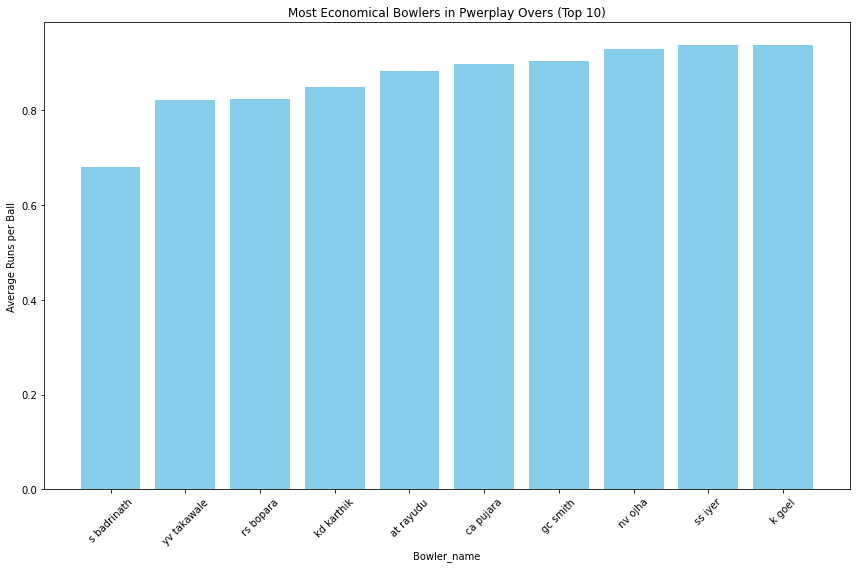

In [0]:
# Assuming 'economical_bowlers_powerplay' is already executed and available as a Spark DataFrame
economical_bowlers_pd = economical_bowlers_powerplay.toPandas()

# Visualizing using Matplotlib 
plt.figure(figsize=(12, 8))

# Limiting to top 10 for clarity in the plot
top_economical_bowlers = economical_bowlers_pd.nsmallest(10, 'avg_run_per_ball')
plt.bar(top_economical_bowlers['player_name'], top_economical_bowlers['avg_run_per_ball'], color='skyblue')
plt.xlabel('Bowler_name')
plt.ylabel('Average Runs per Ball')
plt.title('Most Economical Bowlers in Pwerplay Overs (Top 10)')
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

In [0]:
import seaborn as sns

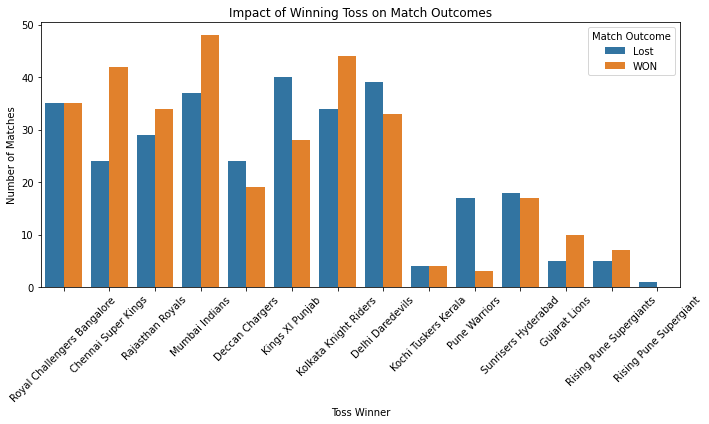

In [0]:
toss_impact_pd = toss_impact_individual_matches.toPandas()

# Creating a countplot to show win/loss after winning toss
plt.figure(figsize = (10, 6))
sns.countplot(x='toss_winner', hue='match_outcome', data=toss_impact_pd)
plt.title('Impact of Winning Toss on Match Outcomes')
plt.xlabel('Toss Winner')
plt.ylabel('Number of Matches')
plt.legend(title = 'Match Outcome')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


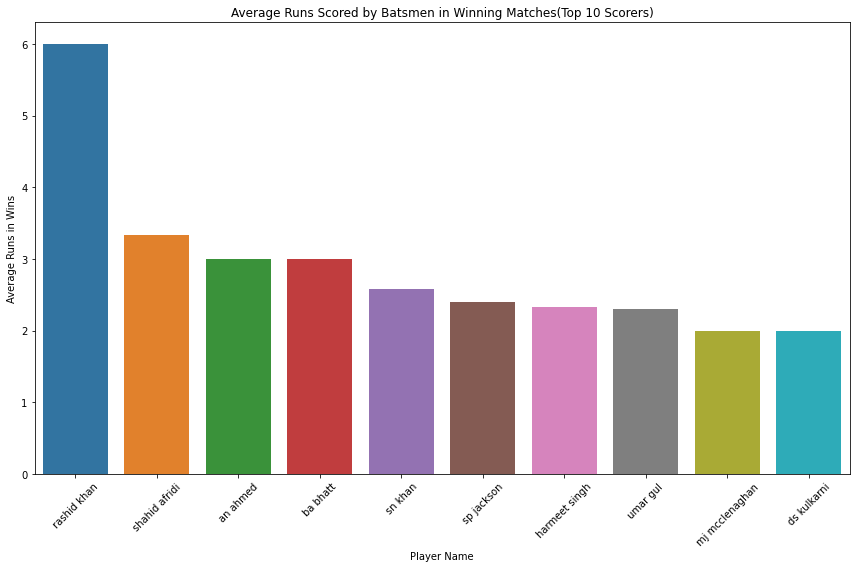

In [0]:
average_runs_pd =average_runs_in_wins.toPandas()

# Using seaborn to plot average runs in winning matches
plt.figure(figsize=(12, 8))
top_scorers = average_runs_pd.nlargest(10, 'avg_run_score')
sns.barplot(x='player_name', y='avg_run_score', data=top_scorers)
plt.title('Average Runs Scored by Batsmen in Winning Matches(Top 10 Scorers)')
plt.xlabel('Player Name')
plt.ylabel('Average Runs in Wins')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

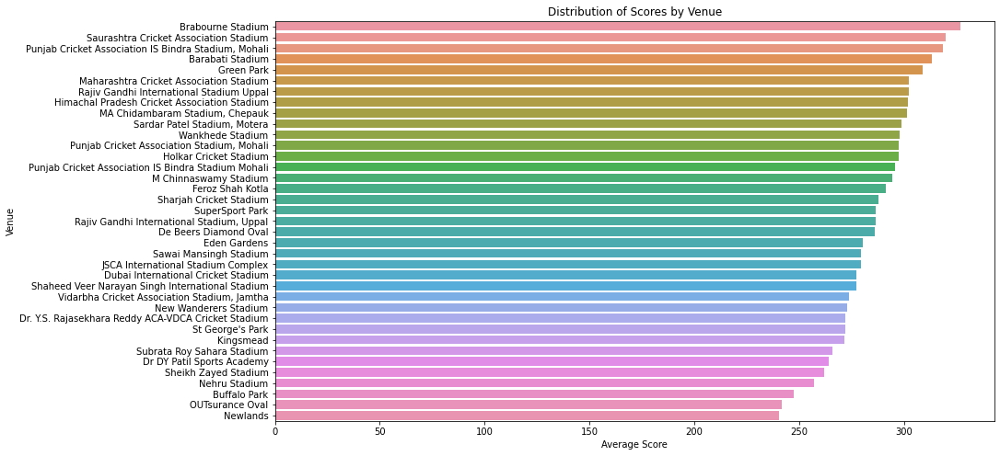

In [0]:
# Convert to Pandas DataFrame
scores_by_venue_pd = scores_by_venue.toPandas()

#Plot
plt.figure(figsize=(14, 8))
sns.barplot(x='average_score', y='venue_name', data=scores_by_venue_pd)
plt.title('Distribution of Scores by Venue')
plt.xlabel('Average Score')
plt.ylabel('Venue')
plt.show()